# Data Validation and Baseline Analysis

In [1]:
import numpy as np
import pandas as pd
import torch
import torch.optim as optim
import os
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler

import pvlib
from pvlib import location, pvsystem, modelchain
from pvlib.modelchain import ModelChain

from pvlib.temperature import TEMPERATURE_MODEL_PARAMETERS
import re


---

#### Data Loading 

### Metadata Interpretation 

1. Station_ID: station07 --> A unique identifier for the site (stations are indexed station00 … station09 in PVOD) 
2. Capacity (kW) Installed capacity of the PV plant, in kW. So 20000 means 20 MW installed capacity 
3. PV_Technology : PV module technology/material type. Poly-Si = polycrystalline silicon
    - Why it matters: technology influences temperature coefficients, efficiency, and thus the physics chain (e.g., DC power vs. cell temperature).
4. Panel_Size (m²): Area of one module, in square meters (1.6335) 
    - Why it matters: panel area is required if you ever convert irradiance → incident energy → expected DC power in a physical/model-chain approach.
5. Module block (string with product specs)
    - Module: Technical specs of the PV module model (here: Yingli YL250P-29b), including:
        - Pmax = 250 Wp: peak power rating at STC (Standard Test Conditions).
        - Vmpp = 29.8 V, Impp = 8.39 A: voltage/current at maximum power point (MPP).
        - manufacturer: Yingli.
    - This is “nameplate electrical behavior” used to parameterize a PV performance model chain (even if you don’t use full pvlib, it’s still context for plausible DC/AC limits).
6. Inverter block (string with product specs)
    - Inverter: Technical specs of the inverter model (here: TBEA TC500KH), including:
        - Rated power = 500 kW (typically AC rated).
        - Max DC input = 618 kW (DC oversized relative to AC is normal).
        - Max DC voltage = 1000 V, Max DC current = 1344 A.
        - 	manufacturer: tbeapower.
    - Why it matters physically: inverter rating implies clipping at high irradiance and constrains the maximum AC output. That should be consistent with your power targets and any physics constraints you impose.
7. "modules per string:20 / strings per inverter:100"
    - Layout: Array wiring configuration:
        - 20 modules per string: series connection → string voltage ≈ 20 × Vmpp (at MPP, temperature-dependent).
        - 100 strings per inverter: parallel strings feeding one inverter → current scales with number of strings.
    - A useful sanity check from your numbers:
        - One string DC power ≈ 20 × 250 W = 5000 W = 5 kW (nameplate).
        - 100 strings per inverter → 100 × 5 kW = 500 kW DC nameplate per inverter, aligning with a ~500 kW-class inverter (with DC max 618 kW allowing oversizing).
    - This consistency is exactly why metadata is “essential if one wishes to convert irradiance to PV power using a model chain”

8. Panel_Number: Total number of PV modules installed at the station (here: 20000).
    - Another sanity check: 80,000 modules × 250 W ≈ 20,000,000 W = 20 MW, which matches the Capacity=20000 kW. Good internal consistency.

9. South 31°:  Array_Tilt (degree) This field encodes orientation + tilt:
    - 	“South” means modules face south (in the Northern Hemisphere, typical azimuth ≈ 180°).
    - 	“31°” is the tilt angle from horizontal.
    - Why it matters: transposition models (e.g., Perez) require tilt/azimuth to convert horizontal irradiance (GHI/DHI/DNI) into plane-of-array irradiance  
10.  Pyranometer block (GHI sensor + DHI sensor) 
    - Instrumentation for local irradiance measurements (LMD in PVOD). You have two sensor channels:
        - GHI sensor (Global Horizontal Irradiance):
            - range: 0–2000 W/m²
            - accuracy: ±5%
            - calibration period: 4 years
            - manufacturer: Jinzhou Licheng Automation Equipment Co., LTD
        - DHI sensor (Diffuse Horizontal Irradiance):
            - range: 0–2000 W/m²
            - accuracy: ±5%
            - calibration period: 2 years
            - manufacturer: Jinzhou Licheng Automation Equipment Co., LTD
    - Why it matters: your “ground truth” irradiance has non-trivial uncertainty (±5%). That uncertainty propagates into any physics baseline and can cap achievable error metrics -------> we have to report this uncertainty in our results and thesis. 

11. 113.64187 :Longitude 
12. 36.64403 :Latitude
    - Geographic coordinates of the station  
    - solar position (zenith/azimuth) depends on lat/lon/time
	- clear-sky and transposition computations require accurate location

Meta data encodes the hard physical constraints your models should respect—especially:
	•	Upper envelope of power (capacity, inverter rating/clipping)
	•	Geometry (south-facing tilt affects sunrise/sunset ramps and seasonal patterns)
	•	Measurement uncertainty (±5% irradiance accuracy influences what “best possible” forecasting error means)


<img src="Gemini_Generated_Image_mgwfismgwfismgwf.png">

In [2]:

def get_station_metadata(station_num, df):
    """
    Retrieves and parses metadata for a specific station from the DataFrame.
    
    Args:
        station_num (int or str): The station number (e.g., 5 or '05').
        df (pd.DataFrame): The source dataframe containing station metadata.
        
    Returns:
        dict: A clean dictionary with numerical values ready for simulation.
    """
    
    # 1. Format the station ID
    station_id_str = f"station{str(station_num).zfill(2)}"
    
    # 2. Filter the dataframe
    station_row = df[df['Station_ID'] == station_id_str]
    
    if station_row.empty:
        raise ValueError(f"Station ID {station_id_str} not found in DataFrame.")
    
    # Get the single row as a Series
    row = station_row.iloc[0]

    # --- Helper 1: Parse "Key:Value" blocks (lines separated by \n) ---
    def parse_kv_string(text_block):
        data = {}
        if isinstance(text_block, str):
            for item in text_block.split('\n'):
                if ':' in item:
                    k, v = item.split(':', 1)
                    data[k.strip()] = v.strip()
        return data

    # --- Helper 2: Extract numeric values safely (e.g., "250 Wp" -> 250.0) ---
    def extract_num(val, default=0.0):
        if pd.isna(val): return default
        match = re.search(r"[-+]?\d*\.\d+|\d+", str(val))
        return float(match.group()) if match else default

    # 3. Parse complex text columns into dictionaries
    module_items = parse_kv_string(row.get('Module', ''))
    inverter_items = parse_kv_string(row.get('Inverters', ''))
    layout_items = parse_kv_string(row.get('Layout', ''))

    # 4. Build the final clean dictionary
    # We use extract_num to ensure we pass numbers (floats/ints) to the model, not strings.
    metadata = {
        # --- Identity & Location ---
        'Station_ID': station_id_str,
        'Longitude': float(row['Longitude']),
        'Latitude': float(row['Latitude']),
        'Array_Tilt': row['Array_Tilt'], # Kept as string (e.g., "South 30") for parsing in main model
        
        # --- System Capacity & Dimensions ---
        'Capacity': float(row['Capacity']),          # Total Station Capacity (kW)
        'Panel_Size': float(row.get('Panel_Size', 1.62)), # Panel Area in m^2
        'Total_Panel_Number': int(row.get('Panel_Number', 0)),
        'PV_Technology': row['PV_Technology'],

        # --- Extracted Module Specs (Cleaned to Float) ---
        'Module_Pmax': extract_num(module_items.get('Pmax'), default=250),
        'Module_Vmpp': extract_num(module_items.get('Vmpp'), default=30),
        'Module_Impp': extract_num(module_items.get('Impp'), default=8),
        
        # --- Extracted Inverter Specs (Cleaned to Float) ---
        'Inverter_Rated_Power': extract_num(inverter_items.get('Rated power'), default=500),
        'Inverter_Max_DC_Voltage': extract_num(inverter_items.get('Max. DC voltage'), default=1000),
        
        # --- Extracted Layout Specs (Cleaned to Int) ---
        # Note: Layout strings can look like "modules per string:20"
        'Modules_per_String': int(extract_num(layout_items.get('modules per string'), default=20)),
        'Strings_per_Inverter': int(extract_num(layout_items.get('strings per inverter'), default=100)),
    }
    
    return metadata



In [3]:
# ==========================================================
# Real Power PV generated power data.

# read the data for PVOD
abs_path = os.path.abspath("/home/muhammadhassan/App_v02/physics_informed_inves/PVODdatasets_v1")

station07_path = os.path.join(abs_path, "station07.csv")
# We parse 'date_time' as dates immediately
station07_data = pd.read_csv(station07_path, parse_dates=['date_time'])
import numpy as np
import pandas as pd
from pvlib import location


# 3. Set Index and Localize to UTC
station07_data.set_index('date_time', inplace=True)
# The data in the CSV is already UTC, but pandas doesn't "know" that yet.
# We must explicitly tell pandas "This is UTC time".
if station07_data.index.tz is None:
    station07_data.index = station07_data.index.tz_localize('UTC')

metadata_path = os.path.join(abs_path, "metadata.csv")
metaData = pd.read_csv(metadata_path)


station07_metaData = get_station_metadata(7, metaData)
station07_data = pd.read_csv(station07_path)

In [4]:
station07_metaData = get_station_metadata(7, metaData)

In [5]:
station07_metaData

{'Station_ID': 'station07',
 'Longitude': 113.64187,
 'Latitude': 36.64403,
 'Array_Tilt': 'South 31°',
 'Capacity': 20000.0,
 'Panel_Size': 1.6335,
 'Total_Panel_Number': 80000,
 'PV_Technology': 'Poly-Si',
 'Module_Pmax': 250.0,
 'Module_Vmpp': 29.8,
 'Module_Impp': 8.39,
 'Inverter_Rated_Power': 500.0,
 'Inverter_Max_DC_Voltage': 1000.0,
 'Modules_per_String': 20,
 'Strings_per_Inverter': 100}

In [6]:
station07_data.head()

,date_time,nwp_globalirrad,nwp_directirrad,nwp_temperature,nwp_humidity,nwp_windspeed,nwp_winddirection,nwp_pressure,lmd_totalirrad,lmd_diffuseirrad,lmd_temperature,lmd_pressure,lmd_winddirection,lmd_windspeed,power
0,2018-06-30 16:00:00,0.0,0.0,19.86,61.42,3.49,338.26,930.57,0,0,17.600000,934.799988,168,0.0,0.0
1,2018-06-30 16:15:00,0.0,0.0,19.81,61.22,3.51,339.19,930.51,0,0,17.500000,934.700012,172,0.0,0.0
2,2018-06-30 16:30:00,0.0,0.0,19.76,61.03,3.52,340.19,930.55,0,0,17.299999,934.599976,174,0.0,0.0
3,2018-06-30 16:45:00,0.0,0.0,19.70,60.91,3.53,340.14,930.47,0,0,17.200001,934.599976,173,0.0,0.0
4,2018-06-30 17:00:00,0.0,0.0,19.60,60.89,3.51,339.90,930.19,0,0,17.100000,934.599976,175,0.0,0.0


In [7]:
station07_data.columns

Index(['date_time', 'nwp_globalirrad', 'nwp_directirrad', 'nwp_temperature',
       'nwp_humidity', 'nwp_windspeed', 'nwp_winddirection', 'nwp_pressure',
       'lmd_totalirrad', 'lmd_diffuseirrad', 'lmd_temperature', 'lmd_pressure',
       'lmd_winddirection', 'lmd_windspeed', 'power'],
      dtype='object')

In [8]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd


df = station07_data.copy()
# Convert date_time to datetime objects for proper scaling
df['date_time'] = pd.to_datetime(df['date_time'])

# Create a figure with a secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])


# 2. Add Measured Power to the RIGHT y-axis (Secondary)
fig.add_trace(
    go.Scatter(
        x=df['date_time'], 
        y=df['power'], 
        name="Measured Power (PV_MEAS)",
        line=dict(color='blue', width=1.5)
    ),
    secondary_y=True,
)



# Update layout for axes and units
fig.update_layout(
    title_text="Interactive PV Power Output Analysis",
    xaxis_title="Time (15-min intervals)",
    hovermode="x unified"
)


# Set RIGHT y-axis details (MW)
fig.update_yaxes(
    title_text="<b>Power Output</b> (MW)", 
    secondary_y=True
)

fig.show()

----

#### Data Prepration 

In [9]:
# make sure that data is sampled at 15 mintutes to ensure Timestamp Synchronization

import pandas as pd

# 1. Setup: Ensure datetime and Sort
df = station07_data.copy()
df['date_time'] = pd.to_datetime(df['date_time'])
df = df.sort_values('date_time')

# 2. Check for Duplicate Timestamps
duplicates = df['date_time'].duplicated().sum()
print(f"## Duplicate Timestamps: {duplicates}")
if duplicates > 0:
    print("Warning: You have duplicate rows for the same time.")

# 3. Analyze Time Intervals (Deltas)
# Calculate the difference between consecutive rows
time_diffs = df['date_time'].diff().dropna()

# Define the expected interval
expected_interval = pd.Timedelta(minutes=15)

# Mask for irregularities
is_correct_interval = (time_diffs == expected_interval)
irregular_intervals = time_diffs[~is_correct_interval]

# 4. Print Diagnostic Report
print("\n## Sampling Interval Diagnostics")
if len(irregular_intervals) == 0:
    print("✅ SUCCESS: All time steps are exactly 15 minutes apart.")
else:
    print(f"❌ MISMATCH: Found {len(irregular_intervals)} irregular intervals.")
    print("\nTop 5 most common irregular intervals found:")
    print(irregular_intervals.value_counts().head())
    
    print("\nExample locations of irregularities:")
    print(irregular_intervals.head(3))

# 5. Check for Missing Data (NaNs) in Columns
# This checks if a timestamp exists but the data for a specific column is missing
print("\n## Missing Values per Column (NaN check)")
missing_data = df.isnull().sum()
print(missing_data[missing_data > 0])

# 6. Verify Total Span
# Calculate how many 15-min slots should exist vs how many you actually have
total_duration = df['date_time'].max() - df['date_time'].min()
expected_rows = (total_duration / expected_interval) + 1
actual_rows = len(df)

print("\n## Completeness Check")
print(f"Expected rows (if perfect 15m grid): {int(expected_rows)}")
print(f"Actual rows in dataframe:            {actual_rows}")
print(f"Missing (or extra) rows:             {int(expected_rows - actual_rows)}")

import pandas as pd

# 1. Identify where the gap is
# We calculate diff again to find the exact index
df = df.sort_values('date_time')
time_diffs = df['date_time'].diff()

# Find the row where the jump happens (values > 15 mins)
gap_mask = time_diffs > pd.Timedelta(minutes=15)
gap_rows = df.loc[gap_mask]

print("## Gap Identification")
for idx, row in gap_rows.iterrows():
    # The gap is between the previous row and this row
    prev_row = df.loc[:idx].iloc[-2] # Get the row immediately before the current one
    print(f"Data stops at:   {prev_row['date_time']}")
    print(f"Data resumes at: {row['date_time']}")
    print(f"Total Missing:   {row['date_time'] - prev_row['date_time']}")
    print("-" * 30)

# 2. Fix the Gap (Reindexing)
# This creates a perfect 15-min grid. 
# Existing data is kept exactly as is. Missing 5 days are filled with NaNs.
# No averaging/resampling math is performed here, so Wind Direction is safe.

# Create the full range of timestamps expected
full_range = pd.date_range(start=df['date_time'].min(), 
                           end=df['date_time'].max(), 
                           freq='15min')

# Reindex the dataframe
df_filled = df.set_index('date_time').reindex(full_range)

# Reset index to get date_time back as a column
df_filled.reset_index(inplace=True)
df_filled.rename(columns={'index': 'date_time'}, inplace=True)

print("\n## Fix Verification")
print(f"New shape: {df_filled.shape}")
print(f"NaN count in 'power' column (should include the new 480 rows): {df_filled['power'].isnull().sum()}")


## Duplicate Timestamps: 0

## Sampling Interval Diagnostics
❌ MISMATCH: Found 1 irregular intervals.

Top 5 most common irregular intervals found:
date_time
5 days 00:15:00    1
Name: count, dtype: int64

Example locations of irregularities:
24000   5 days 00:15:00
Name: date_time, dtype: timedelta64[ns]

## Missing Values per Column (NaN check)
Series([], dtype: int64)

## Completeness Check
Expected rows (if perfect 15m grid): 33408
Actual rows in dataframe:            32928
Missing (or extra) rows:             480
## Gap Identification
Data stops at:   2019-03-07 15:45:00
Data resumes at: 2019-03-12 16:00:00
Total Missing:   5 days 00:15:00
------------------------------

## Fix Verification
New shape: (33408, 15)
NaN count in 'power' column (should include the new 480 rows): 480


we have 480 rows (5 days) of missing data (NaNs) in the middle of your dataset (March 7th to March 12th). 5 days = 1.37% of annual data—technically small, but a contiguous event. Lindig et al. (2020) Directly Recommends *, For gaps longer than a few hours, “other sources should be used to retrieve the data.” Specifically:
	•	Best: Machine Learning regression (Histogram Gradient Boosting achieved 29.8 W/m² RMSE vs. 68 W/m² for physics models) 
    
    

Training on 32928 samples...
Imputing 480 samples...


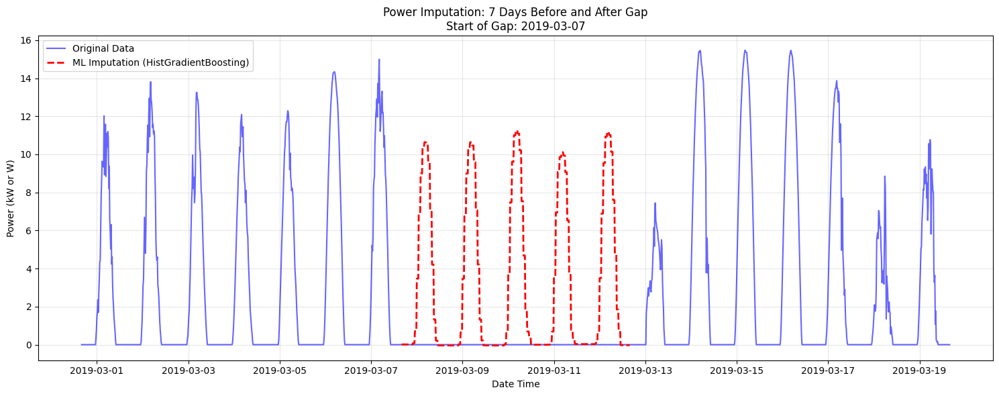


## Imputation Complete
Total NaNs remaining in 'power': 0


In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import HistGradientBoostingRegressor


df = df_filled.copy()

# --- 2. Feature Engineering (Cyclical Time) ---
# Solar data is highly cyclical. 23:00 is close to 00:00. 
# We must encode time using Sine/Cosine so the model understands the cycle.

df['hour'] = df['date_time'].dt.hour
df['dayofyear'] = df['date_time'].dt.dayofyear

# Cyclical Encoding
df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)

df['day_sin'] = np.sin(2 * np.pi * df['dayofyear'] / 365)
df['day_cos'] = np.cos(2 * np.pi * df['dayofyear'] / 365)

# Define features (X) and target (y)
features = ['hour_sin', 'hour_cos', 'day_sin', 'day_cos']
target = 'power'

# --- 3. Train/Test Split ---
# Train on data where Power exists (is not NaN)
train_mask = df[target].notna()
X_train = df.loc[train_mask, features]
y_train = df.loc[train_mask, target]

# Predict on data where Power is NaN (the gap)
predict_mask = df[target].isna()
X_predict = df.loc[predict_mask, features]

print(f"Training on {len(X_train)} samples...")
print(f"Imputing {len(X_predict)} samples...")

# --- 4. Machine Learning Imputation ---
# HistGradientBoosting is robust, handles non-linear relationships well, and is fast.
model = HistGradientBoostingRegressor(random_state=42)
model.fit(X_train, y_train)

# Predict the missing values
imputed_power = model.predict(X_predict)

# Fill the dataframe
df.loc[predict_mask, target] = imputed_power

# --- 5. Visualization: 7 Days Before & After ---
# Find the start of the first gap
gap_start_idx = df[predict_mask].index[0]
gap_start_time = df.loc[gap_start_idx, 'date_time']

# Define time windows (7 days = 7 * 24 * 4 = 672 rows at 15-min freq)
window_half = 7 * 24 * 4 
plot_start = max(0, gap_start_idx - window_half)
plot_end = min(len(df), gap_start_idx + window_half + len(X_predict))

# Slice data for plotting
plot_data = df.iloc[plot_start:plot_end].copy()

# Mark which part was imputed for coloring
plot_data['type'] = 'Original'
plot_data.loc[predict_mask, 'type'] = 'Imputed (ML)'

plt.figure(figsize=(15, 6))

# Plot Original
plt.plot(plot_data[plot_data['type'] == 'Original']['date_time'], 
         plot_data[plot_data['type'] == 'Original']['power'], 
         label='Original Data', color='blue', alpha=0.6)

# Plot Imputed
plt.plot(plot_data[plot_data['type'] == 'Imputed (ML)']['date_time'], 
         plot_data[plot_data['type'] == 'Imputed (ML)']['power'], 
         label='ML Imputation (HistGradientBoosting)', color='red', linestyle='--', linewidth=2)

# Formatting
plt.title(f'Power Imputation: 7 Days Before and After Gap\nStart of Gap: {gap_start_time.date()}')
plt.xlabel('Date Time')
plt.ylabel('Power (kW or W)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# --- 6. Verify Stats ---
print("\n## Imputation Complete")
print(f"Total NaNs remaining in 'power': {df['power'].isnull().sum()}")

In [26]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd



# Convert date_time to datetime objects for proper scaling
df['date_time'] = pd.to_datetime(df['date_time'])

# Create a figure with a secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])


# 2. Add Measured Power to the RIGHT y-axis (Secondary)
fig.add_trace(
    go.Scatter(
        x=df['date_time'], 
        y=df['power'], 
        name="Measured Power (PV_MEAS)",
        line=dict(color='blue', width=1.5)
    ),
    secondary_y=True,
)



# Update layout for axes and units
fig.update_layout(
    title_text="Interactive PV Power Output Analysis",
    xaxis_title="Time (15-min intervals)",
    hovermode="x unified"
)


# Set RIGHT y-axis details (MW)
fig.update_yaxes(
    title_text="<b>Power Output</b> (MW)", 
    secondary_y=True
)

fig.show()

In [11]:
# save the data
df.to_csv('imputed_data_station07.csv', index=False)

---

In [17]:
# read the data
df = pd.read_csv('imputed_data_station07.csv', parse_dates=['date_time'])


In [18]:
df.head()

,date_time,nwp_globalirrad,nwp_directirrad,nwp_temperature,nwp_humidity,nwp_windspeed,nwp_winddirection,nwp_pressure,lmd_totalirrad,lmd_diffuseirrad,...,lmd_pressure,lmd_winddirection,lmd_windspeed,power,hour,dayofyear,hour_sin,hour_cos,day_sin,day_cos
0,2018-06-30 16:00:00,0.0,0.0,19.86,61.42,3.49,338.26,930.57,0.0,0.0,...,934.799988,168.0,0.0,0.0,16,181,-0.866025,-0.500000,0.025818,-0.999667
1,2018-06-30 16:15:00,0.0,0.0,19.81,61.22,3.51,339.19,930.51,0.0,0.0,...,934.700012,172.0,0.0,0.0,16,181,-0.866025,-0.500000,0.025818,-0.999667
2,2018-06-30 16:30:00,0.0,0.0,19.76,61.03,3.52,340.19,930.55,0.0,0.0,...,934.599976,174.0,0.0,0.0,16,181,-0.866025,-0.500000,0.025818,-0.999667
3,2018-06-30 16:45:00,0.0,0.0,19.70,60.91,3.53,340.14,930.47,0.0,0.0,...,934.599976,173.0,0.0,0.0,16,181,-0.866025,-0.500000,0.025818,-0.999667
4,2018-06-30 17:00:00,0.0,0.0,19.60,60.89,3.51,339.90,930.19,0.0,0.0,...,934.599976,175.0,0.0,0.0,17,181,-0.965926,-0.258819,0.025818,-0.999667


----

##### Understanding the PV Model Chain: From Meteorological Data to Power Output
The model chain is a sequential series of physics-based and empirical transformations that convert raw weather measurements into predicted AC power output from a PV system. It is not a single model but rather an integrated pipeline of components, each with a specific function. 

1. Step 1: Meteorological Data Collection
- raw inputs are measured or predicted weather variables, These inputs contain the fundamental energy available and environmental conditions.:
    - Global Horizontal Irradiance (GHI): Total solar radiation on a horizontal plane (W/m²)
	- Direct Normal Irradiance (DNI): Beam radiation perpendicular to the sun’s rays
	- Diffuse Horizontal Irradiance (DHI): Scattered radiation from the sky and ground reflection
	- Ambient Temperature: Air temperature (°C)
	- Wind Speed/Direction: Affects module cooling (m/s)
	- Pressure, Humidity: Secondary parameters for detailed models

2. Step 2: Irradiance Decomposition
If we only have GHI (most common scenario), you must decompose it into DNI and DHI components because they behave differently when rotated onto a tilted surface.
    - Decomposition models: DISC method, Erbs method
        - Why needed: Direct radiation (DNI) projects geometrically onto the tilted plane; diffuse radiation (DHI) requires empirical transposition models. Physics models at this stage include correlations between clearness indices to estimate the split.
    - Output: DNI and DHI (or direct/diffuse fractions of GHI)

3. Step 3: Irradiance Transposition (Perez, King, Reindl, etc.)
    - Perez model and its competitors: Transposition converts horizontal irradiance components into Plane-of-Array (POA) irradiance—the actual irradiance incident on your tilted modules.
        - Direct component: Projected using angle of incidence (AOI) geometry
        - Diffuse component: Complex empirical relationships accounting for sky dome brightness patterns
        - Ground-reflected component: Uses albedo (ground reflectivity) 
        - Perez (1990): Most universal; ~70 W/m² RMSE

    - Critical limitation: Physics models here assume static atmospheric clarity and albedo. They cannot capture:
        - Rapid cloud transients
        - Aerosol optical depth variations
        - Non-linear interactions between cloud cover and diffuse irradiance

    - Output: POA Irradiance (G_POA) on the tilted module surface

4. Step 4: Module Temperature Model
    - modules do not operate at ambient temperature. They heat up due to solar absorption and cool via convection/radiation.
    - This step predicts module operating temperature (T_mod), which directly affects power output (efficiency decreases ~0.5% per °C).
    - Physics-based models
        - Simple models:
            - NOCT (Nominal Operating Cell Temperature): Uses a fixed relationship between irradiance, temperature, and wind
	        - Sandia Module Temperature Model (SMTM): Accounts for wind speed and mounting configuration with empirical coefficients
    - Advanced physics models (like PINN):
        - Model heat balance: Solar absorption - Electrical power output - Convective losses - Radiative losses
        - Account for convection (free and forced convection with wind direction)
        - Model radiative losses using Stefan-Boltzmann equations
        - Separate front/rear surface temperatures

    - Inputs: POA Irradiance, ambient temperature, wind speed/direction, module specifications
    - Output: Module temperature (typically 30–80°C)

5. Step 5: DC Power Calculation
    - Convert irradiance and temperature into electrical power using module specifications and efficiency models:
        - Sandia Advanced Model:$$P_{DC}=G_{POA} \times \eta_{module} \times A_{module} \times (1-\gamma(T_{mod}-T_{STC}))$$ Where:
            - $G_{POA}$ = Plane-of-Array irradiance (W/m²)
            - $\eta_{module}$ = Module efficiency at STC (Standard Test Conditions)
            - $A_{module}$ = Module area (m²)
            - $\gamma$ = Temperature coefficient of power (typically –0.004 to –0.005 per °C)
            - $T_{mod}$ = Module temperature
    - Key insight: Temperature is critical—high temperatures directly reduce efficiency, offsetting the advantage of high irradiance.
    - Output: DC Power (kW)

6. Step 6: Inverter Conversion (DC → AC)
    - The final step converts DC power to grid-compatible AC power, accounting for inverter losses and saturation.
        - Sandia Inverter Model:
	    - Efficiency typically 95–98%
	    - Non-linear efficiency curve (lower efficiency at low power, peaks at ~50% rated power)
	    - Clipping: If DC power exceeds inverter rating, AC output is limited
    - Output: AC Power (final measured quantity)

SO the claim is that the ML models outperforming physics models using measured GHI, DHI, RH, and solar position (without temperature sensor) was specifically discussing nowcasting or very short-term estimation, not day-ahead forecasting. but my premiss is that the ML physics informed models can outperform physics models using measured GHI, DHI, RH, and solar position (without temperature sensor) for day-ahead forecasting.


### How NWP is used in PVOD

For a specific record like January 17, 2018, the Numerical Weather Prediction (NWP) values do not represent a 24-hour ahead forecast generated on the previous day (Jan 16). Instead, they represent a forecast generated roughly two days prior (Jan 15) to cover the full operational “Day-Ahead” window for that specific local time zone.
Based on the dataset documentation
- Generation Time: The NWP model runs once daily at 12:00 UTC (20:00 Beijing Time).
- Horizon (Leading Time): The dataset extracts the forecast for the window +28 to +54 hours after the generation time.
- Why this window? This specific 26-hour window is chosen to cover the entirety of the next operational day in China (UTC+8).
- Start (+28h): 12:00 UTC + 28h = 16:00 UTC (Next Day) = 00:00 Beijing Time (Day after Next).
- End (+54h): 12:00 UTC + 54h = 18:00 UTC (Next Day) = 02:00 Beijing Time (Two Days after).

We are going to use the NWP values as input to the PINN model to predict the power output of the PV system. Also to calculate the power output of the PV system using the physics based model (model chain).


----

### POA Calculation

POA is more important. Because;
- POA is used in PR (Performance Ratio) calculation. GHI is not used.
- The energy to be produced by the panel is directly proportional to POA.
- Since POA varies according to the positioning of the system, GHI alone is not enough information.

**a sanity check that your physical inputs and timestamps are consistent enough that any downstream KPI (PR, clear-sky index, residual learning) is meaningful**

calculate the Plane-of-Array (POA) irradiance for a specific PV station using the pvlib library. This is to ensure compliance with the methodology described in the PVOD dataset paper (Yao et al., 2021), which recommends using the Perez (1990) transposition model.

The "Tilt Gain": we notice that poa_global_calc is generally higher than lmd_totalirrad (GHI) during midday. This is because your panels are tilted 31° South, which is optimized to catch more direct sunlight than a flat ground sensor.


#### The core hypothesis behind the scatter
If your PV system and irradiance are measured correctly and aligned in time, then higher in-plane irradiance (POA) should correspond to higher power, up to physical limits (capacity/clipping). Not perfectly linear (temperature, wind cooling, inverter control, soiling, curtailment), but monotonic and tight.

So the Power vs POA scatter is a compact way to test whether:
    - time index is aligned (no offset between power and irradiance),
    - irradiance geometry is plausible (tilt/azimuth and transposition not wildly wrong),
    - irradiance sensor isn’t inconsistent with the PV plane (or, in our case, whether POA computed from GHI/DHI behaves plausibly),
    - aggregation type isn’t mismatched (instantaneous power vs averaged irradiance), which Lindig says is often overlooked but critical 

we used a standard, validated decomposition approach” rather than a hand-rolled closure. 

In [19]:
station07_metaData

{'Station_ID': 'station07',
 'Capacity_DC_MW': 20.0,
 'Capacity_AC_MW': 12.6,
 'DC_AC_Ratio': 1.59,
 'Actual_Inverter_Count': 25,
 'Inverter_Rating_kW': 500,
 'Module_Pmax': 250,
 'Modules_per_String': 20,
 'Strings_per_Inverter': 100,
 'Array_Tilt': 31,
 'Latitude': 36.64403,
 'Longitude': 113.64187,
 'Inverter_Paco': 500000,
 'Inverter_Idcmax': 1344}

In [20]:
# import pandas as pd
# import numpy as np
# import pvlib

# # 1. Setup Station Metadata (Station 08)

# altitude = 435  # Updated to 435m as per your note
# surface_tilt = 31
# surface_azimuth = 180  # pvlib convention: 180 is South
# latitude = station07_metaData['latitude']
# longitude = station07_metaData['longitude']


# # Define the Location object
# location = pvlib.location.Location(latitude, longitude, altitude=altitude)

# # 2. Ensure DataFrame has a DatetimeIndex and is localized to UTC
# # (Assuming df_clean is your working dataframe)
# if 'date_time' in df_clean.columns:
#     df_clean = df_clean.set_index('date_time')

# if df_clean.index.tz is None:
#     df_clean.index = df_clean.index.tz_localize('UTC')
# else:
#     df_clean.index = df_clean.index.tz_convert('UTC')

# # 3. Calculate Solar Position
# print("Calculating solar position...")
# solpos = location.get_solarposition(df_clean.index)

# # 4. Calculate DNI (Direct Normal Irradiance) with Robust Handling
# print("Calculating DNI with safety checks...")
# zenith_rad = np.deg2rad(solpos['apparent_zenith'])
# ghi = df_clean['lmd_totalirrad']
# dhi = df_clean['lmd_diffuseirrad']

# # Formula: DNI = (GHI - DHI) / cos(Zenith)
# # Calculate DNI, allowing temporary Inf/NaN
# with np.errstate(divide='ignore', invalid='ignore'):
#     dni = (ghi - dhi) / np.cos(zenith_rad)

# # A. Fix Infinite/NaN values (caused by division by zero)
# dni = dni.replace([np.inf, -np.inf], 0)
# dni = dni.fillna(0)

# # B. Physically Impossible DNI Check (Negative values)
# dni = dni.clip(lower=0)

# # C. Sun Elevation Check (Crucial fix)
# # Force DNI to 0 when the sun is too low (> 87 degrees zenith)
# # This removes unstable values at sunrise/sunset
# dni[solpos['apparent_zenith'] > 85] = 0

# df_clean['calc_dni'] = dni

# # 5. Calculate Plane-of-Array (POA) Irradiance using Perez Model
# print("Calculating POA (Perez Model)...")
# dni_extra = pvlib.irradiance.get_extra_radiation(df_clean.index)

# poa_irrad = pvlib.irradiance.get_total_irradiance(
#     surface_tilt=surface_tilt,
#     surface_azimuth=surface_azimuth,
#     solar_zenith=solpos['apparent_zenith'],
#     solar_azimuth=solpos['azimuth'],
#     dni=df_clean['calc_dni'],
#     ghi=df_clean['lmd_totalirrad'],
#     dhi=df_clean['lmd_diffuseirrad'],
#     dni_extra=dni_extra,
#     model='perez',
#     albedo=0.25 # represents the reflectance of typical ground surfaces found around PV installations, such as dry grass, soil, or concrete.
# )

# # 6. Store and Normalize Results
# df_clean['poa_global_calc'] = poa_irrad['poa_global']
# # Fill any lingering NaNs in POA (e.g., from nighttime) with 0
# df_clean['poa_global_calc'] = df_clean['poa_global_calc'].fillna(0)

# # Normalize (G_STC = 1000 W/m²)
# df_clean['poa_global_calc_norm'] = df_clean['poa_global_calc'] / 1000.0

# # Reset index to make date_time a column again
# df_clean.reset_index(inplace=True)

# # --- Validation ---
# print("\n## POA Calculation Validation")
# # Select rows around noon (11:00-13:00 local solar time roughly corresponds to 03:00-05:00 UTC for China)
# # Adjusting validation window to likely daylight hours in China (UTC+8)
# # Noon in China (12:00) is approx 04:00 UTC.
# daylight_mask = (df_clean['date_time'].dt.hour >= 3) & (df_clean['date_time'].dt.hour <= 5)
# cols_val = ['date_time', 'lmd_totalirrad', 'lmd_diffuseirrad', 'calc_dni', 'poa_global_calc']
# print(df_clean.loc[daylight_mask, cols_val].head())

# print("\n## Summary Stats (POA Global Calc)")
# print(df_clean['poa_global_calc'].describe())

import pandas as pd
import numpy as np
import pvlib

# 1. Setup Station Metadata (Station 07/08 Context)
# -------------------------------------------------------------------------
altitude = 948        # Station altitude in meters
surface_tilt = 31     # Fixed tilt
surface_azimuth = 180 # South facing (pvlib convention: North=0, South=180)

# Ensure these come from your metadata object
latitude = station07_metaData['Latitude']
longitude = station07_metaData['Longitude']

# Define the Location object
location = pvlib.location.Location(latitude, longitude, altitude=altitude)

# 2. Timezone Handling & Indexing
# -------------------------------------------------------------------------
# CRITICAL FIX: If SCADA data is local time (North China), we must localize 
# to 'Asia/Shanghai' first, then convert to UTC for pvlib to work correctly.
# -------------------------------------------------------------------------
df_clean = df.copy(deep=True)
if 'date_time' in df_clean.columns:
    df_clean = df_clean.set_index('date_time')

# Check if index is naive (no timezone)
if df_clean.index.tz is None:
    print("Localizing naive timestamps to Asia/Shanghai (UTC+8)...")
    # Assumption: Raw SCADA data is in local China time.
    # If your data is ALREADY in UTC, change this to 'UTC'
    df_clean.index = df_clean.index.tz_localize('UTC') # ('Asia/Shanghai')

# Convert to UTC for internal solar position calculations
df_clean.index = df_clean.index.tz_convert('UTC')

# 3. Pre-Calculation Cleaning (Physics Sanity)
# -------------------------------------------------------------------------
# Negative irradiance is physically impossible (sensor noise). 
# Clip to 0 immediately to prevent downstream math errors.
cols_irrad = ['lmd_totalirrad', 'lmd_diffuseirrad']
df_clean[cols_irrad] = df_clean[cols_irrad].clip(lower=0)

# 4. Calculate Solar Position
# -------------------------------------------------------------------------
print("Calculating solar position...")
solpos = location.get_solarposition(df_clean.index)
apparent_zenith = solpos['apparent_zenith']

# 5. DNI Reconstruction (The "Fragile" Step - Fortified)
# -------------------------------------------------------------------------
print("Calculating DNI with robust constraints...")

ghi = df_clean['lmd_totalirrad']
dhi = df_clean['lmd_diffuseirrad']
zenith_rad = np.deg2rad(apparent_zenith)

# A. Calculate DNI_extra (Extraterrestrial) for upper bound checks
dni_extra = pvlib.irradiance.get_extra_radiation(df_clean.index)

# B. Calculate DNI geometry: DNI = (GHI - DHI) / cos(Z)
with np.errstate(divide='ignore', invalid='ignore'):
    dni = (ghi - dhi) / np.cos(zenith_rad)

# --- Lindig-style Filtering & Safety ---

# Fix 1: Infinite values (division by zero)
dni = dni.replace([np.inf, -np.inf], 0)

# Fix 2: Negative DNI (Calculated)
dni = dni.clip(lower=0)

# Fix 3: Physical Consistency Check (DHI cannot exceed GHI)
# If DHI > GHI, it implies measurement error or horizon shading. 
# We set DNI to 0 in these cases to avoid garbage data.
bad_physics_mask = dhi > ghi
dni[bad_physics_mask] = 0

# Fix 4: Low Sun Angle Masking (The "Explosion" preventer)
# When sun is low (Zenith > 85), cos(Z) is tiny, causing massive DNI spikes.
dni[apparent_zenith > 85] = 0

# Fix 5: Upper Bound Cap
# DNI should rarely exceed extraterrestrial radiation significantly.
# We cap it to prevent outliers from skewing the Power vs POA curve.
dni = np.minimum(dni, dni_extra * 1.1) # Allow 10% buffer for cloud enhancement
dni = dni.fillna(0)

df_clean['calc_dni'] = dni

# 6. Calculate POA Irradiance (Perez Model)
# -------------------------------------------------------------------------
print("Calculating POA (Perez Model)...")

poa_irrad = pvlib.irradiance.get_total_irradiance(
    surface_tilt=surface_tilt,
    surface_azimuth=surface_azimuth,
    solar_zenith=apparent_zenith,     # Consistent zenith usage
    solar_azimuth=solpos['azimuth'],
    dni=df_clean['calc_dni'],
    ghi=df_clean['lmd_totalirrad'],
    dhi=df_clean['lmd_diffuseirrad'],
    dni_extra=dni_extra,
    model='perez',
    albedo=0.25 # Assumption: Standard ground reflectance
)

# Store results
df_clean['poa_global_calc'] = poa_irrad['poa_global']
df_clean['poa_diffuse_calc'] = poa_irrad['poa_diffuse'] # Useful for debugging

# Final cleanup: fill NaNs with 0 (nighttime) and norm
df_clean['poa_global_calc'] = df_clean['poa_global_calc'].fillna(0)
df_clean['poa_global_calc_norm'] = df_clean['poa_global_calc'] / 1000.0

# 7. Validation: Solar Noon Alignment Check (Optimized)
# -------------------------------------------------------------------------
print("\n## Validation: Time Alignment Check (Single Day)")

# 1. Find the day with the highest calculated POA irradiance (likely a clear day)
max_irr_timestamp = df_clean['poa_global_calc'].idxmax()
max_irr_day = max_irr_timestamp.date()

print(f"Checking alignment for date: {max_irr_day}")

# 2. Calculate Theoretical Solar Noon ONLY for that specific day
# We create a single-item DatetimeIndex for that day at midnight to feed pvlib
day_index = pd.DatetimeIndex([f"{max_irr_day} 00:00:00"]).tz_localize(df_clean.index.tz)

# Use method='spa' (no extra arguments needed, very accurate)
transit_data = location.get_sun_rise_set_transit(day_index, method='spa')
theoretical_noon = transit_data['transit'].iloc[0]

# 3. Find the actual peak time in your data for that day
# Filter data for that specific date
day_slice = df_clean[df_clean.index.date == max_irr_day]
data_peak_time = day_slice['poa_global_calc'].idxmax()

# 4. Compare
print(f"Theoretical Solar Noon: {theoretical_noon.strftime('%H:%M')} UTC")
print(f"Data Peak Irradiance:   {data_peak_time.strftime('%H:%M')} UTC")

diff_minutes = (data_peak_time - theoretical_noon).total_seconds() / 60
print(f"Difference: {diff_minutes:.1f} minutes")

if abs(diff_minutes) > 45:
    print("--> WARNING: Large offset detected (>45 mins). Check Timezone setting (Step 2).")
else:
    print("--> SUCCESS: Peak aligns with Solar Noon. Timestamps likely correct.")

# Reset index for export/plotting if needed
df_clean.reset_index(inplace=True)

Localizing naive timestamps to Asia/Shanghai (UTC+8)...
Calculating solar position...
Calculating DNI with robust constraints...
Calculating POA (Perez Model)...

## Validation: Time Alignment Check (Single Day)
Checking alignment for date: 2018-08-05
Theoretical Solar Noon: 04:31 UTC
Data Peak Irradiance:   04:45 UTC
Difference: 13.5 minutes
--> SUCCESS: Peak aligns with Solar Noon. Timestamps likely correct.


Station07 timestamps behave like UTC. and synchronized with UTC.

We verified timestamp consistency by comparing the time of maximum measured irradiance with computed solar noon for representative clear-sky days. Station07 aligned when timestamps were treated as UTC (median offset ~one sample), whereas interpreting timestamps as Asia/Shanghai introduced large systematic offsets, indicating the dataset timestamps are in UTC for this station.

In [21]:
df_clean.head()

,date_time,nwp_globalirrad,nwp_directirrad,nwp_temperature,nwp_humidity,nwp_windspeed,nwp_winddirection,nwp_pressure,lmd_totalirrad,lmd_diffuseirrad,...,hour,dayofyear,hour_sin,hour_cos,day_sin,day_cos,calc_dni,poa_global_calc,poa_diffuse_calc,poa_global_calc_norm
0,2018-06-30 16:00:00+00:00,0.0,0.0,19.86,61.42,3.49,338.26,930.57,0.0,0.0,...,16,181,-0.866025,-0.500000,0.025818,-0.999667,0.0,0.0,0.0,0.0
1,2018-06-30 16:15:00+00:00,0.0,0.0,19.81,61.22,3.51,339.19,930.51,0.0,0.0,...,16,181,-0.866025,-0.500000,0.025818,-0.999667,0.0,0.0,0.0,0.0
2,2018-06-30 16:30:00+00:00,0.0,0.0,19.76,61.03,3.52,340.19,930.55,0.0,0.0,...,16,181,-0.866025,-0.500000,0.025818,-0.999667,0.0,0.0,0.0,0.0
3,2018-06-30 16:45:00+00:00,0.0,0.0,19.70,60.91,3.53,340.14,930.47,0.0,0.0,...,16,181,-0.866025,-0.500000,0.025818,-0.999667,0.0,0.0,0.0,0.0
4,2018-06-30 17:00:00+00:00,0.0,0.0,19.60,60.89,3.51,339.90,930.19,0.0,0.0,...,17,181,-0.965926,-0.258819,0.025818,-0.999667,0.0,0.0,0.0,0.0


In [22]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Ensure date_time is accessible
if 'date_time' not in df_clean.columns:
    df_clean.reset_index(inplace=True)

# Create the figure
fig = go.Figure()

# 1. Trace: Measured GHI (Global Horizontal Irradiance)
# This is what the pyranometer measures horizontally.
fig.add_trace(go.Scatter(
    x=df_clean['date_time'],
    y=df_clean['lmd_totalirrad'],
    mode='lines',
    name='Measured GHI (Horizontal)',
    line=dict(color='dodgerblue', width=1),
    opacity=0.6
))

# 2. Trace: Calculated POA (Plane-of-Array Irradiance)
# This is what hits the tilted panels (calculated via Perez model).
fig.add_trace(go.Scatter(
    x=df_clean['date_time'],
    y=df_clean['poa_global_calc'],
    mode='lines',
    name='Calculated POA (Tilted 31°)',
    line=dict(color='darkorange', width=1.5)
))

# 3. Layout Configuration
fig.update_layout(
    title='Irradiance Validation: Measured GHI vs. Calculated POA',
    xaxis_title='Date Time (UTC)',
    yaxis_title='Irradiance (W/m²)',
    hovermode='x unified',  # Shows both values when you hover over a time
    template='plotly_white',
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01,
        bgcolor="rgba(255, 255, 255, 0.8)"
    ),
    height=600  # Good height for viewing details
)

# 4. Add Range Slider
# Allows you to zoom into specific days/weeks easily
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1d", step="day", stepmode="backward"),
            dict(count=7, label="1w", step="day", stepmode="backward"),
            dict(step="all")
        ])
    )
)


fig.show()

We verified timestamp consistency by comparing the time of maximum measured irradiance with computed solar noon for representative clear-sky days. Station07 aligned when timestamps were treated as UTC (median offset ~one sample), whereas interpreting timestamps as Asia/Shanghai introduced large systematic offsets, indicating the dataset timestamps are in UTC for this station.

- Data has time stamps in UTC to eliminate Daylight Saving Time shifts ${Lindig2020}$
- Data is sampled at 15-minute intervals$

---

2. Phase 2: Reproducing Figure 6 Quality Checks (Step-by-Step)

	1. Step 1: Detect Sensor Misalignment (Replicating Fig 6a)
		1. Action: Create a scatter plot of Power vs. Irradiance.
		2. X-axis: In-Plane Irradiance (POA).
		3. Y-axis: Power Output (Ground Truth).
		4. Validation Check:
		5. Fit a linear regression line to the data.
		6. Flag: Look for a “split” pattern where data points form two distinct linear slopes instead of one.
		7. Interpretation: If found, your irradiance sensor tilt/azimuth likely does not match your panel orientation, or there is a timestamp offset.


--- [Step 1] Quality Check: Sensor Misalignment for Station 07 ---
Linear Regression Fit:
  Slope: 0.0106
  Intercept: 0.4297
  R-squared: 0.8808

Validation Check:
  -> Look for a 'split' pattern in the plot (two distinct slopes).
  -> If found, it implies: Sensor Tilt/Azimuth Mismatch OR Timestamp Offset.
  [WARNING] Low R² (0.88). Potential misalignment, timestamp offset, or noisy data detected.


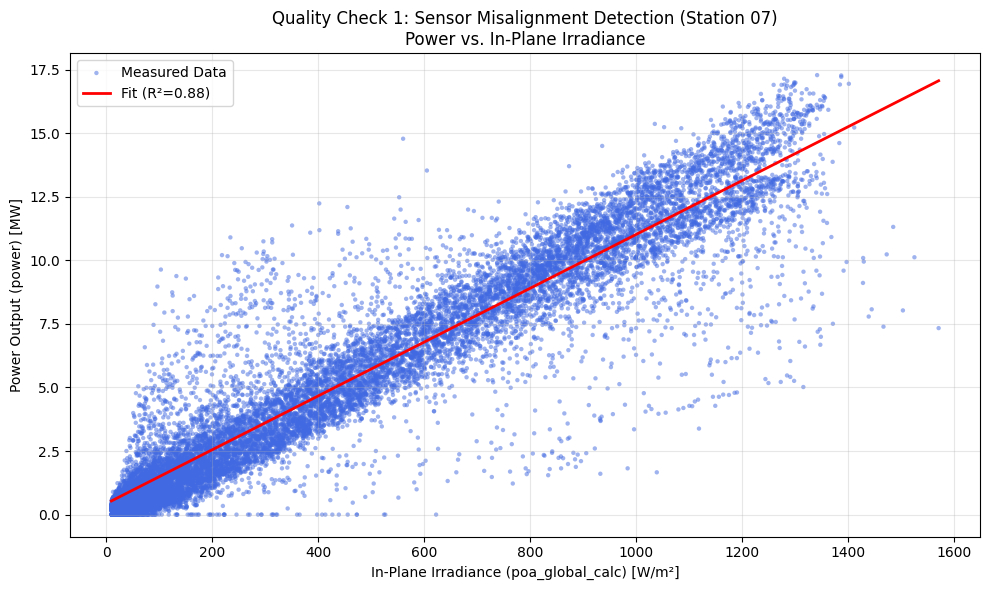


--- [Step 2] Quality Check: Seasonal Consistency for Station 07 ---



--- [Step 3] Quality Check: Low Power Anomalies (Interactive) ---
Filtering for Power < 0.01 AND Irradiance > 20...
Found 239 anomaly records.



--- [Step 4] Quality Check: Shading Analysis (Azimuth vs Elevation) ---
Calculating Solar Position for Lat:36.64403, Lon:113.64187...
Found 252 shading/outage candidates.


In [23]:
import preprocessing_data as pp
import importlib
importlib.reload(pp) # Ensure latest version
# 1. Sensor Misalignment
pp.check_sensor_misalignment(
    df_clean, 
    irradiance_col='poa_global_calc', 
    power_col='power', 
    station_name="Station 07"
)
# 2. Seasonal Consistency
pp.check_seasonal_consistency(
    df_clean, 
    irradiance_col='poa_global_calc', 
    power_col='power', 
    time_col='date_time',
    station_name="Station 07"
)
# 3. Interactive Anomaly Check
pp.investigate_low_power_anomalies(
    df_clean, 
    power_col='power', # 'poa_global_calc_norm', 'power_norm'
    poa_col='poa_global_calc', # Ensure this column exists or use 'lmd_totalirrad'
    time_col='date_time', 
    threshold_mw=0.01, 
    min_irrad= 20

)


# 4. Shading Analysis (Solar Position)
lat = station07_metaData['Latitude']
lon = station07_metaData['Longitude']
pp.check_shading_analysis_position(
    df_clean,
    lat=lat, lon=lon,
    power_col='power',
    threshold_mw=0.01,  # Lower threshold for "Zero" power
    min_irrad=20
)

- The “Horizontal Floor” (High Irradiance, Zero Power): -> This indicates system outages or inverter failures where the sun was shining, but the system produced no power.
- This “fat” scatter usually comes from shading (e.g., mountains, nearby structures) or snow cover (irradiance sensor sees sun, panels are covered in snow), rather than just a geometric misalignment.

---

After the removal of the horizon mask, the data cleaning process should be repeated. 

In [24]:
importlib.reload(pp) # Ensure latest version
from preprocessing_data import apply_horizon_mask, remove_outages


# 
lat = station07_metaData['Latitude']
lon = station07_metaData['Longitude']
station07_clean = apply_horizon_mask(df_clean, lat=lat, lon=lon,
                   power_col='power', poa_col='poa_global_calc', time_col='date_time',
                   poa_threshold=400,          # W/m²
                   near_zero_power_mw=0.02,    # MW  
                   max_shading_elev_cap=25.0)  # degrees

# 2. Outage Removal (Removes random equipment failures)
station07_clean = remove_outages(
    df_clean,
    power_col='power',
    irradiance_col='poa_global_calc',
    min_power=0.02,
    min_irrad = 500
)


--- [Step 4] Quality Check: Geometry-Locked Mismatch Detection ---
Parameters: POA > 400 W/m², Power < 0.02 MW, Elev Cap: 25.0°
Calculating Solar Position...
Found 10 strict mismatches (near-zero power with high POA)
Derived Max Shading Elevation: 25.0° (data: 73.8°, cap: 25.0°)
Analyzing 1 mismatches at elevation < 25.0°
Azimuth Failure Rate: mean=0.11%, std=0.00%, threshold=10.00%
No azimuth sectors exceed the outlier threshold.

--- [Step 0.5] Data Cleaning: Removing Outages ---
Applying Filter: Excluding records where Power < 0.02 AND Irradiance > 500
Removed 3 / 33408 records (0.0%) detected as outages.



--- [Step 1] Quality Check: Sensor Misalignment for Station 07 ---
Linear Regression Fit:
  Slope: 0.0106
  Intercept: 0.4308
  R-squared: 0.8811

Validation Check:
  -> Look for a 'split' pattern in the plot (two distinct slopes).
  -> If found, it implies: Sensor Tilt/Azimuth Mismatch OR Timestamp Offset.
  [WARNING] Low R² (0.88). Potential misalignment, timestamp offset, or noisy data detected.


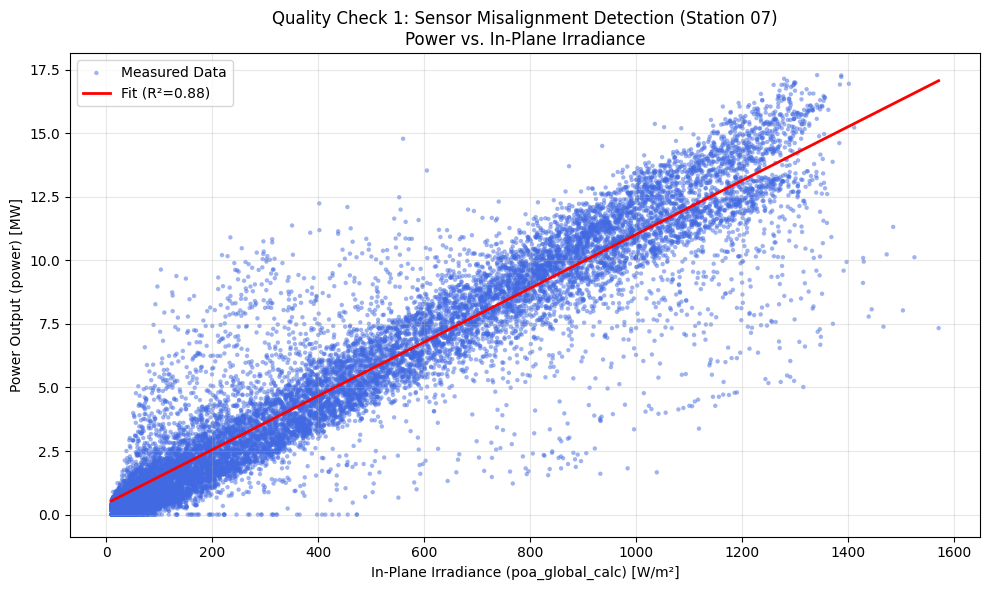


--- [Step 2] Quality Check: Seasonal Consistency for Station 07 ---



--- [Step 3] Quality Check: Low Power Anomalies (Interactive) ---
Filtering for Power < 0.01 AND Irradiance > 20...
Found 236 anomaly records.



--- [Step 4] Quality Check: Shading Analysis (Azimuth vs Elevation) ---
Calculating Solar Position for Lat:36.64403, Lon:113.64187...
Found 249 shading/outage candidates.


In [25]:
import preprocessing_data as pp
import importlib
importlib.reload(pp) # Ensure latest version
# 1. Sensor Misalignment
pp.check_sensor_misalignment(
    station07_clean, 
    irradiance_col='poa_global_calc', 
    power_col='power', 
    station_name="Station 07"
)
# 2. Seasonal Consistency
pp.check_seasonal_consistency(
    station07_clean, 
    irradiance_col='poa_global_calc', 
    power_col='power', 
    time_col='date_time',
    station_name="Station 07"
)
# 3. Interactive Anomaly Check
pp.investigate_low_power_anomalies(
    station07_clean, 
    power_col='power', # 'poa_global_calc_norm', 'power_norm'
    poa_col='poa_global_calc', # Ensure this column exists or use 'lmd_totalirrad'
    time_col='date_time', 
    threshold_mw=0.01, 
    min_irrad= 20

)


# 4. Shading Analysis (Solar Position)
# Note: Provide lat/lon from metadata if not in dataframe
lat = station07_metaData['Latitude']
lon = station07_metaData['Longitude']
pp.check_shading_analysis_position(
    station07_clean,
    lat=lat, lon=lon,
    power_col='power',
    threshold_mw=0.01,  # Lower threshold for "Zero" power
    min_irrad=50
)

----

Step 2: Identify Inverter Clipping (Replicating Fig 6b)
	•	Action: Plot Energy (or Power) vs. Time for clear, high-irradiance days.
	•	Validation Check:
	•	Inspect the peak of the daily curve.
	•	Flag: Look for a “flat top” or plateau where power stays constant despite changing irradiance around solar noon.
	•	Threshold: If  for >15 mins, mark as clipping. This is expected behavior, not necessarily a fault, but distinct from data errors.

In [26]:
import preprocessing_data as pp
import importlib
importlib.reload(pp) # Ensure latest version


# 3. Clipping Checks

# B) Manual Diagnosis (Dashboard)
pp.diagnose_inverter_clipping(
    station07_clean,
    power_col='power',
    time_col='date_time',
    irradiance_col='poa_global_calc',
    capacity_mw=20.0
)



--- [Step 2.5] Diagnostic: Inverter Clipping Visualization ---


this plot answers: “When irradiance is high, does power repeatedly hit the cap and stay there (plateau), or does it remain below it?” expected saturation behavior


Power almost never approaches the dashed 99% capacity line; peaks are mostly around ~15–17 MW even in the brightest (high-irradiance) points

This suggests the plant is not AC-limited by a 20 MW cap during this period, so the limiting factor is elsewhere (DC sizing, availability, temperature derate, curtailment below cap, soiling, etc.)

So Step 2 plot indicates no significant inverter clipping at the assumed 20 MW capacity, because power peaks remain well below the 99% capacity line even under high irradiance.

What “limiting factor elsewhere” means (examples)
If power is below 20 MW during high irradiance, typical reasons include:
	•	The real AC cap is lower than 20 MW at the measurement point (e.g., grid/export limit, transformer limit, operational setpoint).
	•	Curtailment (operator reduces output even though the sun could support more).
	•	Availability / outages at partial scale (some inverters or blocks offline, so plant can’t reach full capacity).
	•	Temperature derating (hot modules reduce DC power; this reduces the power available to convert).
	•	Soiling / degradation / mismatch losses lowering effective DC input.


---


Step 3: Detect Negative Power & Polarity Issues (Replicating Fig 6c)
	•	Action: Filter your dataset for Negative Power Values.
	•	Validation Check:
	•	Count occurrences where .
	•	Flag: Any negative values (outside of minor standby consumption) indicate a polarity switch or sensor calibration error.
	•	Action: Set these to 0 or NaN for analysis, or investigate wiring if systematic.

In [27]:
import preprocessing_data as pp
import importlib
importlib.reload(pp) # Ensure latest version
# 4. Negative Power / Polarity Check
pp.check_negative_power(
    station07_clean,
    power_col='power',
    time_col='date_time',
    fix_action=None # Set to 'zero' or 'nan' to fix
)


--- [Step 3] Quality Check: Negative Power (Polarity Check) ---
FAIL: Found 148 negative values (0.44%).
Min Value: -0.0435 MW


Action: None taken (use fix_action='zero' or 'nan' to correct).


,date_time,nwp_globalirrad,nwp_directirrad,nwp_temperature,nwp_humidity,nwp_windspeed,nwp_winddirection,nwp_pressure,lmd_totalirrad,lmd_diffuseirrad,...,hour,dayofyear,hour_sin,hour_cos,day_sin,day_cos,calc_dni,poa_global_calc,poa_diffuse_calc,poa_global_calc_norm
0,2018-06-30 16:00:00+00:00,0.0,0.0,19.86,61.42,3.49,338.26,930.57,0.0,0.0,...,16,181,-0.866025,-0.500000,0.025818,-0.999667,0.0,0.000000,0.000000,0.000000
1,2018-06-30 16:15:00+00:00,0.0,0.0,19.81,61.22,3.51,339.19,930.51,0.0,0.0,...,16,181,-0.866025,-0.500000,0.025818,-0.999667,0.0,0.000000,0.000000,0.000000
2,2018-06-30 16:30:00+00:00,0.0,0.0,19.76,61.03,3.52,340.19,930.55,0.0,0.0,...,16,181,-0.866025,-0.500000,0.025818,-0.999667,0.0,0.000000,0.000000,0.000000
3,2018-06-30 16:45:00+00:00,0.0,0.0,19.70,60.91,3.53,340.14,930.47,0.0,0.0,...,16,181,-0.866025,-0.500000,0.025818,-0.999667,0.0,0.000000,0.000000,0.000000
4,2018-06-30 17:00:00+00:00,0.0,0.0,19.60,60.89,3.51,339.90,930.19,0.0,0.0,...,17,181,-0.965926,-0.258819,0.025818,-0.999667,0.0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33403,2019-06-13 14:45:00+00:00,0.0,0.0,20.58,66.40,3.89,359.89,931.33,15.0,0.0,...,14,164,-0.500000,-0.866025,0.313107,-0.949718,0.0,0.267811,0.267811,0.000268
33404,2019-06-13 15:00:00+00:00,0.0,0.0,20.58,65.52,3.89,0.41,931.40,15.0,0.0,...,15,164,-0.707107,-0.707107,0.313107,-0.949718,0.0,0.267811,0.267811,0.000268
33405,2019-06-13 15:15:00+00:00,0.0,0.0,20.50,65.29,3.93,357.09,931.49,18.0,0.0,...,15,164,-0.707107,-0.707107,0.313107,-0.949718,0.0,0.321374,0.321374,0.000321
33406,2019-06-13 15:30:00+00:00,0.0,0.0,20.34,65.71,4.04,352.89,931.57,19.0,0.0,...,15,164,-0.707107,-0.707107,0.313107,-0.949718,0.0,0.339228,0.339228,0.000339


---


Step 4: Check for Data Shifts (Replicating Fig 6d)
	•	Action: Plot Daily Cumulative Energy vs. Time (over months/years).
	•	Validation Check:
	•	Look for sudden “step changes” in the baseline energy yield that do not correlate with seasonality.
	•	Metric: Calculate the rolling mean of daily yield (e.g., 30-day window). A sudden jump (e.g., >10% change overnight) without meteorological cause indicates a measurement shift/equipment change.

In [28]:

import preprocessing_data as pp
import importlib
importlib.reload(pp) # Ensure latest version

# 5. Data Shift Check (Step Changes)
pp.check_data_shifts(
    station07_clean,
    power_col='power',
    time_col='date_time',
    window_days=30,  # 30-day baseline
    threshold=0.10   # 10% jump triggers flag
)


--- [Step 4] Quality Check: Data Shifts (Rolling Mean) ---
Daily Yield Analysis: 349 days.
Shift Detection (Threshold=10%): Found 0 potential shifts.


----

Step 6: Detect Inverter Failures (Replicating Fig 6f)
	•	Action: Calculate and plot Daily Performance Ratio (PR) vs. Time.
	•	Formula:  (Daily sums).
	•	Validation Check:
	•	Establish a baseline PR (e.g., median of previous 30 days).
	•	Flag: Any day where Daily PR drops significantly (e.g., < 50% of baseline) while irradiance was sufficient.
	•	Interpretation: Deep drops usually point to inverter shutdowns/failures.

In [29]:
import preprocessing_data as pp
import importlib
importlib.reload(pp) # Ensure latest version


# 6. Inverter Failure Detection (PR)
daily_flags = pp.detect_inverter_failures_pr(
    station07_clean,
    p_nom=20.0, # Nominal Capacity MW
    pac_col='power',
    poa_col='poa_global_calc',
    time_col='date_time',
    window_days=30,
    pr_drop_factor=0.5 # Flag if PR < 50% of baseline
)


--- [Step 6] Quality Check: Inverter Failures (Daily PR) ---
Analyzed 349 days.
Flagged 6 potential inverter failures (PR < 50% of Baseline).
Top 5 Flagged Days:
                 E_AC        H_POA        PR  PR_Baseline
date                                                     
2018-11-01  17.220179  5039.728200  0.170844     0.558296
2018-12-27  11.901712  2594.356753  0.229377     0.547001
2019-02-14   6.164021  2730.467168  0.112875     0.507520
2019-03-13  41.279402  7565.163016  0.272826     0.618400
2019-06-03  30.709971  7189.960391  0.213561     0.626920


/home/muhammadhassan/App_v02/physics_informed_inves/PINNS/test_for_thesis_experiments/preprocessing_data.py:1031: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



---

In [30]:

station07_clean = df.copy()

In [31]:
station07_clean = df_clean.copy() 

In [32]:
station07_clean.columns

Index(['date_time', 'nwp_globalirrad', 'nwp_directirrad', 'nwp_temperature',
       'nwp_humidity', 'nwp_windspeed', 'nwp_winddirection', 'nwp_pressure',
       'lmd_totalirrad', 'lmd_diffuseirrad', 'lmd_temperature', 'lmd_pressure',
       'lmd_winddirection', 'lmd_windspeed', 'power', 'hour', 'dayofyear',
       'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'calc_dni',
       'poa_global_calc', 'poa_diffuse_calc', 'poa_global_calc_norm'],
      dtype='object')

In [33]:
station07_metaData = {
    'Station_ID': 'station07',
    'Capacity_DC_MW': 20.0,              # Total DC capacity (80k modules × 250W)
    'Capacity_AC_MW': 12.6,              # Actual AC capacity (measured from peak)
    'DC_AC_Ratio': 1.59,                 # Inverter oversizing factor
    'Actual_Inverter_Count': 25,         # Empirically derived from 11.57 MW peak
    'Inverter_Rating_kW': 500,           # Per BYD TC500KH datasheet
    'Module_Pmax': 250,
    'Modules_per_String': 20,
    'Strings_per_Inverter': 100,
    'Array_Tilt': 31,
    'Latitude': 36.64403,
    'Longitude': 113.64187,
    'Inverter_Paco': 500000,
    'Inverter_Idcmax': 1344
}
station07_metaData

{'Station_ID': 'station07',
 'Capacity_DC_MW': 20.0,
 'Capacity_AC_MW': 12.6,
 'DC_AC_Ratio': 1.59,
 'Actual_Inverter_Count': 25,
 'Inverter_Rating_kW': 500,
 'Module_Pmax': 250,
 'Modules_per_String': 20,
 'Strings_per_Inverter': 100,
 'Array_Tilt': 31,
 'Latitude': 36.64403,
 'Longitude': 113.64187,
 'Inverter_Paco': 500000,
 'Inverter_Idcmax': 1344}

---

In [36]:
import pandas as pd
import numpy as np
import re
import pvlib
from pvlib import pvsystem, modelchain
from pvlib.temperature import TEMPERATURE_MODEL_PARAMETERS
from pvlib.modelchain import ModelChain


# ---------------------------------------------------------
# METADATA (Corrected with Empirical Calibration)
# ---------------------------------------------------------
station07_metaData = {
    'Station_ID': 'station07',
    'Capacity_DC_MW': 20.0,              # Total DC capacity (80k modules × 250W)
    'Capacity_AC_MW': 12.6,              # Actual AC capacity (measured from peak)
    'DC_AC_Ratio': 1.59,                 # Inverter oversizing factor
    'Actual_Inverter_Count': 25,         # Empirically derived from 11.57 MW peak
    'Inverter_Rating_kW': 500,           # Per BYD TC500KH datasheet
    'Module_Pmax': 250,
    'Modules_per_String': 20,
    'Strings_per_Inverter': 100,
    'Array_Tilt': 31,
    'Latitude': 36.64403,
    'Longitude': 113.64187,
    'Inverter_Paco': 500000,
    'Inverter_Idcmax': 1344
}


def calculate_clearsky_indices(metadata, df):
    """
    Calculates both Irradiance (K_CS) and Power (K_PV) Clear Sky Indices.
    Uses empirically calibrated inverter count for accurate power scaling.
    """
    
    print(f"--- Processing {metadata.get('Station_ID', 'Unknown')} ---")
    
    # ---------------------------------------------------------
    # 1. SETUP LOCATION & TIME
    # ---------------------------------------------------------
    lat = metadata['Latitude']
    lon = metadata['Longitude']
    from pvlib import location
    site = location.Location(lat, lon, tz='UTC')
    
    # --- FIX: Ensure index is Datetime and Localized to UTC ---
    if not isinstance(df.index, pd.DatetimeIndex):
        df['date_time'] = pd.to_datetime(df['date_time']) 
        df.set_index('date_time', inplace=True)
        
    # ---------------------------------------------------------
    # 2. CALCULATE CLEAR SKY IRRADIANCE (GHI_clr)
    # ---------------------------------------------------------
    print("Calculating Clear Sky Irradiance...")
    
    from pvlib.iotools import get_cams

    email = 'mohamedtareck95@gmail.com'

    try:
        cams_data, cams_meta = get_cams(
            latitude=metadata['Latitude'],
            longitude=metadata['Longitude'],
            start=df.index.min(),
            end=df.index.max(),
            email=email,
            identifier='mcclear',
            time_step='15min',
            time_ref='UT',
            integrated=False,
            map_variables=True
        )

        # McClear returns ghi_clear/dni_clear/dhi_clear
        cs = cams_data.rename(columns={
            'ghi_clear': 'ghi',
            'dni_clear': 'dni',
            'dhi_clear': 'dhi',
        })

        print("✓ Using McClear (satellite-based)")

    except Exception as e:
        print(f"⚠ McClear failed ({e}), falling back to Ineichen")
        cs = site.get_clearsky(df.index, model='ineichen')

    df['GHI_clr'] = cs['ghi']

    # Calculate K_CS (Irradiance Clear Sky Index)
    if 'lmd_totalirrad' in df.columns:
        meas_ghi = df['lmd_totalirrad']
        df['K_CS_day'] = np.where(
            df['GHI_clr'] > 10, 
            meas_ghi / df['GHI_clr'], 
            0.0
        )
        df['K_CS_dayNight'] = meas_ghi / df['GHI_clr']
        df['K_CS'] = df['K_CS_day']
        df['K_CS'] = df['K_CS'].clip(lower=0.0, upper=1.25)
    else:
        print("Warning: 'lmd_totalirrad' column missing. K_CS not calculated.")

    # ---------------------------------------------------------
    # 3. SETUP PV SYSTEM MODEL (For P_CLR) - ONE INVERTER BLOCK
    # ---------------------------------------------------------
    try:
        tilt_str = str(metadata.get('Array_Tilt'))
        tilt_match = re.search(r"[\d.]+", tilt_str)
        tilt = float(tilt_match.group()) if tilt_match else 31.0
    except Exception as e:
        print(f"Error extracting tilt: {e} .... Assuming 31 degrees")
        tilt = 31.0
    
    azimuth = 180 

    module_params = pvsystem.retrieve_sam('CECMod')['Yingli_Energy__China__YL250P_29b']
    
    # BYD TC500KH Inverter Parameters
    inverter_parameters = {
        'Vac': 315,              # Rated AC Voltage
        'Pso': 4500,             # Tare loss
        'Paco': 500000,          # 500 kW Rated AC Power
        'Pdco': 505050,          # DC power at which Paco is reached
        'Vdco': 665,             # Midpoint of MPPT range
        'C0': -3.45645e-08,      # Efficiency coefficients
        'C1': 2.12268e-05,
        'C2': 0.000603471,
        'C3': 0.000463011,
        'Pnt': 2.0,              # Night tare loss
        'Vdcmax': 1000,          # Max DC Voltage
        'Idcmax': 1344,          # Max DC Current
        'Mppt_low': 480,         # MPPT lower limit
        'Mppt_high': 850         # MPPT upper limit
    }
    
    temp_model = TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']
    
    # This models ONE inverter block
    system = pvsystem.PVSystem(
        surface_tilt=tilt,
        surface_azimuth=azimuth,
        module_parameters=module_params,
        inverter_parameters=inverter_parameters,
        temperature_model_parameters=temp_model,
        modules_per_string=metadata['Modules_per_String'],
        strings_per_inverter=metadata['Strings_per_Inverter']
    )

    # ---------------------------------------------------------
    # 4. RUN MODEL CHAIN FOR CLEAR-SKY POWER
    # ---------------------------------------------------------
    print("Running Clear-Sky PV Power Simulation...")

    mc = ModelChain(
        system, site, 
        transposition_model='perez',
        solar_position_method='nrel_numpy',
        aoi_model='physical', 
        spectral_model='no_loss'
    )

    mc.run_model(cs)

    # ---------------------------------------------------------
    # 5. SCALE TO PLANT LEVEL (✅ CORRECTED)
    # ---------------------------------------------------------
    # ✅ Use empirically calibrated inverter count
    actual_inverter_count = metadata.get('Actual_Inverter_Count', None)
    
    if actual_inverter_count is None:
        # ❌ Fallback to old method (will overestimate)
        print("⚠️  WARNING: 'Actual_Inverter_Count' not found in metadata.")
        print("    Attempting to calculate from Capacity_DC_MW...")
        
        # Try to get DC capacity
        capacity_dc_mw = metadata.get('Capacity_DC_MW', None)
        if capacity_dc_mw is None:
            # Last resort: try old 'Capacity' field (in kW)
            capacity_kw = metadata.get('Capacity', 20000)
            capacity_dc_mw = capacity_kw / 1000 if capacity_kw > 500 else capacity_kw
        
        inverter_rating_mw = metadata.get('Inverter_Rating_kW', 500) / 1000
        scaling_factor = capacity_dc_mw / inverter_rating_mw
        
        print(f"    Using theoretical scaling: {scaling_factor:.0f} inverters")
        print(f"    ⚠️  This may overestimate power if DC/AC > 1.2")
    else:
        # ✅ Use calibrated value
        scaling_factor = actual_inverter_count
        print(f"✓ Using calibrated inverter count: {scaling_factor} inverters")
        print(f"  (AC Capacity: {metadata.get('Capacity_AC_MW', 'N/A')} MW)")
    
    # Scale single-inverter output to plant level
    p_clr_one_inverter = mc.results.ac.fillna(0)  # Watts
    p_clr_plant_watts = p_clr_one_inverter * scaling_factor
    df['P_CLR'] = p_clr_plant_watts / 1_000_000  # Convert to MW

    # ---------------------------------------------------------
    # 6. CALCULATE POWER CLEAR SKY INDEX (K_PV)
    # ---------------------------------------------------------
    if 'power' in df.columns:
        meas_power = df['power']
        
        # Convert to MW if necessary
        if meas_power.max() > 500:
            meas_power = meas_power / 1000.0
            
        df['K_PV'] = np.where(
            df['P_CLR'] > 0.1,  # Threshold in MW (100 kW)
            meas_power / df['P_CLR'], 
            0.0
        )
        df['K_PV'] = df['K_PV'].clip(lower=0.0, upper=1.25)
        
        print(f"✓ K_PV calculated. Range: [{df['K_PV'].min():.3f}, {df['K_PV'].max():.3f}]")
    else:
        print("Warning: 'power' column missing. K_PV not calculated.")

    # ---------------------------------------------------------
    # 7. SUMMARY STATISTICS
    # ---------------------------------------------------------
    print(f"\n📊 Clear-Sky Index Summary:")
    print(f"   GHI_clr peak: {df['GHI_clr'].max():.0f} W/m²")
    print(f"   P_CLR peak: {df['P_CLR'].max():.2f} MW")
    if 'K_CS' in df.columns:
        print(f"   K_CS mean (daytime): {df[df['K_CS'] > 0]['K_CS'].mean():.3f}")
    if 'K_PV' in df.columns:
        print(f"   K_PV mean (daytime): {df[df['K_PV'] > 0]['K_PV'].mean():.3f}")

    return df


# ---------------------------------------------------------
# EXECUTION
# ---------------------------------------------------------
station07_clean_index_df = calculate_clearsky_indices(station07_metaData, station07_clean)


--- Processing station07 ---
Calculating Clear Sky Irradiance...
✓ Using McClear (satellite-based)
Running Clear-Sky PV Power Simulation...
✓ Using calibrated inverter count: 25 inverters
  (AC Capacity: 12.6 MW)
✓ K_PV calculated. Range: [0.000, 1.250]

📊 Clear-Sky Index Summary:
   GHI_clr peak: 1059 W/m²
   P_CLR peak: 11.92 MW
   K_CS mean (daytime): 0.809
   K_PV mean (daytime): 0.862


In [37]:
station07_clean_index_df.head()

,nwp_globalirrad,nwp_directirrad,nwp_temperature,nwp_humidity,nwp_windspeed,nwp_winddirection,nwp_pressure,lmd_totalirrad,lmd_diffuseirrad,lmd_temperature,...,calc_dni,poa_global_calc,poa_diffuse_calc,poa_global_calc_norm,GHI_clr,K_CS_day,K_CS_dayNight,K_CS,P_CLR,K_PV
date_time,,,,,,,,,,,,,,,,,,,,,
2018-06-30 16:00:00+00:00,0.0,0.0,19.86,61.42,3.49,338.26,930.57,0.0,0.0,17.600000,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,-0.00005,0.0
2018-06-30 16:15:00+00:00,0.0,0.0,19.81,61.22,3.51,339.19,930.51,0.0,0.0,17.500000,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,-0.00005,0.0
2018-06-30 16:30:00+00:00,0.0,0.0,19.76,61.03,3.52,340.19,930.55,0.0,0.0,17.299999,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,-0.00005,0.0
2018-06-30 16:45:00+00:00,0.0,0.0,19.70,60.91,3.53,340.14,930.47,0.0,0.0,17.200001,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,-0.00005,0.0
2018-06-30 17:00:00+00:00,0.0,0.0,19.60,60.89,3.51,339.90,930.19,0.0,0.0,17.100000,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,-0.00005,0.0


In [96]:
station07_clean_index_df.columns

Index(['nwp_globalirrad', 'nwp_directirrad', 'nwp_temperature', 'nwp_humidity',
       'nwp_windspeed', 'nwp_winddirection', 'nwp_pressure', 'lmd_totalirrad',
       'lmd_diffuseirrad', 'lmd_temperature', 'lmd_pressure',
       'lmd_winddirection', 'lmd_windspeed', 'power', 'hour', 'dayofyear',
       'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'calc_dni',
       'poa_global_calc', 'poa_diffuse_calc', 'poa_global_calc_norm',
       'GHI_clr', 'K_CS_day', 'K_CS_dayNight', 'K_CS', 'P_CLR', 'K_PV'],
      dtype='object')

In [97]:
import pandas as pd
import numpy as np
import re
import pvlib
from pvlib import pvsystem, modelchain
from pvlib.temperature import TEMPERATURE_MODEL_PARAMETERS


# ---------------------------------------------------------
# METADATA (Corrected with Empirical Calibration)
# ---------------------------------------------------------
station07_metaData = {
    'Station_ID': 'station07',
    'Capacity_DC_MW': 20.0,              # Total DC capacity (80k modules × 250W)
    'Capacity_AC_MW': 12.6,              # Actual AC capacity (measured from peak)
    'DC_AC_Ratio': 1.59,                 # Inverter oversizing factor
    'Actual_Inverter_Count': 25,         # Empirically derived from 11.57 MW peak
    'Inverter_Rating_kW': 500,           # Per BYD TC500KH datasheet
    'Module_Pmax': 250,
    'Modules_per_String': 20,
    'Strings_per_Inverter': 100,
    'Array_Tilt': 31,
    'Latitude': 36.64403,
    'Longitude': 113.64187,
    'Inverter_Paco': 500000,
    'Inverter_Idcmax': 1344
}


def calculate_nwp_power(metadata, df):
    """
    Calculates expected PV Power output (MW) based on NWP Weather Forecasts.
    Uses empirically calibrated inverter count for accurate scaling.
    """
    station_id = metadata.get('Station_ID', 'Unknown')
    print(f"--- Calculating NWP Physical Power for {station_id} ---")
    
    # ---------------------------------------------------------
    # 1. SETUP LOCATION & TIME
    # ---------------------------------------------------------
    lat = float(metadata['Latitude'])
    lon = float(metadata['Longitude'])
    site = pvlib.location.Location(lat, lon, tz='UTC')
    
    # Ensure datetime index
    if not isinstance(df.index, pd.DatetimeIndex):
        if 'date_time' in df.columns:
            df['date_time'] = pd.to_datetime(df['date_time']) 
            df.set_index('date_time', inplace=True)
    
    if df.index.tz is None:
        df.index = df.index.tz_localize('UTC')

    # ---------------------------------------------------------
    # 2. PREPARE NWP WEATHER DATA
    # ---------------------------------------------------------
    solpos = site.get_solarposition(df.index)
    df['sun_elevation'] = solpos['elevation']

    weather_nwp = pd.DataFrame(index=df.index)
    weather_nwp['ghi'] = df['nwp_globalirrad'].clip(lower=0)
    weather_nwp['dni'] = df['nwp_directirrad'].clip(lower=0)
    weather_nwp['temp_air'] = df['nwp_temperature']
    weather_nwp['wind_speed'] = df['nwp_windspeed']
    weather_nwp['pressure'] = df['nwp_pressure'] * 100 if 'nwp_pressure' in df.columns else 101325.0

    # Calculate DHI from GHI and DNI
    zenith_rad = np.radians(solpos['zenith'])
    weather_nwp['dhi'] = (weather_nwp['ghi'] - (weather_nwp['dni'] * np.cos(zenith_rad))).clip(lower=0)
    
    # Zero out nighttime
    is_night = solpos['elevation'] <= 0
    weather_nwp.loc[is_night, ['ghi', 'dni', 'dhi']] = 0

    # ---------------------------------------------------------
    # 3. DEFINE PV SYSTEM (ONE INVERTER BLOCK)
    # ---------------------------------------------------------
    tilt_match = re.search(r"(\d+(\.\d+)?)", str(metadata.get('Array_Tilt', '31')))
    tilt = float(tilt_match.group(1)) if tilt_match else 31.0    

    # Use CEC database module parameters
    module_params = pvsystem.retrieve_sam('CECMod')['Yingli_Energy__China__YL250P_29b']
    
    # BYD TC500KH Inverter Parameters
    inverter_parameters = {
        'Vac': 315,              # Rated AC Voltage
        'Pso': 4500,             # Tare loss (~0.9% of Paco)
        'Paco': 500000,          # 500 kW Rated AC Power
        'Pdco': 505050,          # DC power at which Paco is reached
        'Vdco': 665,             # Midpoint of MPPT range
        'C0': -3.45645e-08,      # Efficiency coefficients
        'C1': 2.12268e-05,
        'C2': 0.000603471,
        'C3': 0.000463011,
        'Pnt': 2.0,              # Night tare loss
        'Vdcmax': 1000,          # Max DC Voltage
        'Idcmax': 1344,          # Max DC Current
        'Mppt_low': 480,         # MPPT lower limit
        'Mppt_high': 850         # MPPT upper limit
    }

    # Create PV System (models ONE inverter block)
    system = pvsystem.PVSystem(
        surface_tilt=tilt, 
        surface_azimuth=180,
        module_parameters=module_params, 
        inverter_parameters=inverter_parameters,
        temperature_model_parameters=TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass'],
        modules_per_string=int(metadata['Modules_per_String']),
        strings_per_inverter=int(metadata['Strings_per_Inverter'])
    )

    # ---------------------------------------------------------
    # 4. RUN MODEL CHAIN
    # ---------------------------------------------------------
    mc = modelchain.ModelChain(
        system, site, 
        transposition_model='perez', 
        aoi_model='physical', 
        spectral_model='no_loss'
    )

    mc.run_model(weather_nwp)
    
    # ---------------------------------------------------------
    # 5. SCALE TO PLANT LEVEL (✅ CORRECTED)
    # ---------------------------------------------------------
    # ✅ Use empirically calibrated inverter count
    actual_inverter_count = metadata.get('Actual_Inverter_Count', None)
    
    if actual_inverter_count is None:
        # ❌ Fallback to old method (will overestimate)
        print("⚠️  WARNING: 'Actual_Inverter_Count' not found in metadata.")
        print("    Calculating theoretical scaling from DC capacity...")
        
        # Try to get capacity
        capacity_dc_mw = metadata.get('Capacity_DC_MW', None)
        if capacity_dc_mw is None:
            # Try old 'Capacity' field (assumes kW)
            capacity_kw = metadata.get('Capacity', 20000)
            capacity_dc_mw = capacity_kw / 1000
        
        # Calculate from DC capacity
        block_dc_kw = (int(metadata['Modules_per_String']) * 
                      int(metadata['Strings_per_Inverter']) * 
                      float(metadata['Module_Pmax'])) / 1000
        
        scaling_factor = (capacity_dc_mw * 1000) / block_dc_kw
        
        print(f"    Using theoretical scaling: {scaling_factor:.0f} inverters")
        print(f"    ⚠️  This may overestimate power by ~60% if DC/AC > 1.2")
    else:
        # ✅ Use calibrated value
        scaling_factor = actual_inverter_count
        print(f"✓ Using calibrated inverter count: {scaling_factor} inverters")
        print(f"  (AC Capacity: {metadata.get('Capacity_AC_MW', 'N/A')} MW)")
    
    # Scale single-inverter output to plant level
    one_inverter_mw = mc.results.ac.fillna(0) / 1_000_000
    df['NWP_Power_MW'] = (one_inverter_mw * scaling_factor).clip(lower=0.0)
    
    # ---------------------------------------------------------
    # 6. VALIDATION SUMMARY
    # ---------------------------------------------------------
    peak_nwp = df['NWP_Power_MW'].max()
    print(f"\n📊 NWP Power Calculation Summary:")
    print(f"   Peak NWP Power: {peak_nwp:.2f} MW")
    print(f"   Expected Range: 0 - {metadata.get('Capacity_AC_MW', 'N/A')} MW")
    
    if peak_nwp > metadata.get('Capacity_AC_MW', 15) * 1.1:
        print(f"   ⚠️  WARNING: Peak exceeds AC capacity by >10%")
        print(f"   This suggests incorrect scaling factor.")
    
    return df


# ---------------------------------------------------------
# EXECUTION
# ---------------------------------------------------------
station07_clean_index_nwp_df = calculate_nwp_power(station07_metaData, station07_clean_index_df)


--- Calculating NWP Physical Power for station07 ---
✓ Using calibrated inverter count: 25 inverters
  (AC Capacity: 12.6 MW)

📊 NWP Power Calculation Summary:
   Peak NWP Power: 12.45 MW
   Expected Range: 0 - 12.6 MW


In [ ]:
import pandas as pd
import numpy as np
import re
import pvlib
from pvlib import pvsystem, modelchain
from pvlib.temperature import TEMPERATURE_MODEL_PARAMETERS
import plotly.graph_objects as go


# ---------------------------------------------------------
# METADATA (Corrected with Empirical Calibration)
# ---------------------------------------------------------
station07_metaData = {
    'Station_ID': 'station07',
    'Capacity': 20000,              # DC Capacity in kW (or 20 MW DC)
    'Module_Pmax': 250,
    'Modules_per_String': 20,
    'Strings_per_Inverter': 100,
    'Array_Tilt': 'South 31°',
    'Latitude': 36.64403,
    'Longitude': 113.64187,
    'Inverter_Paco': 500000,
    'Inverter_Idcmax': 1344,
    # ✅ CORRECTED: Empirically calibrated from measured peak (11.57 MW)
    'Actual_Inverter_Count': 25,    # NOT 40 (due to DC/AC = 1.59)
    'Capacity_AC_MW': 12.6           # Actual AC capacity
}


def plot_nwp_vs_ground_truth(metadata, df, target_col='power', weather_source='nwp'):
    """
    Calculates power using NWP weather variables and plots it against Ground Truth.
    Assumes dataframe has columns: '{source}_totalirrad', '{source}_temperature', etc.
    """
    station_id = metadata.get('Station_ID', 'Station')
    print(f"Generating NWP vs Ground Truth Plot for {station_id} using source: {weather_source}...")

    # ---------------------------------------------------------
    # 1. SETUP & WEATHER CLEANING (NWP Variables)
    # ---------------------------------------------------------
    # Ensure timezone
    if df.index.tz is None:
        df.index = df.index.tz_localize('UTC')
        
    lat, lon = float(metadata['Latitude']), float(metadata['Longitude'])
    site = pvlib.location.Location(lat, lon, tz='UTC')
    solpos = site.get_solarposition(df.index)

    # Map Weather Columns based on source (default 'nwp')
    # Assumes standard naming convention: nwp_totalirrad, nwp_temperature, etc.
    weather = pd.DataFrame(index=df.index)
    
    # Try/Except block to handle potential column naming differences
    try:
        weather['ghi'] = df[f'{weather_source}_totalirrad'].clip(lower=0)
        weather['dhi'] = df[f'{weather_source}_diffuseirrad'].clip(lower=0)
        weather['temp_air'] = df[f'{weather_source}_temperature']
        weather['wind_speed'] = df[f'{weather_source}_windspeed']
        weather['pressure'] = df.get(f'{weather_source}_pressure', 1013.25) * 100
    except KeyError as e:
        print(f"Error: Missing column in dataframe for {weather_source} variables. {e}")
        return None

    # Zero out nighttime noise
    is_night = solpos['elevation'] <= 0
    weather.loc[is_night, ['ghi', 'dhi']] = 0

    # Calculate DNI (Direct Normal Irradiance)
    zenith_rad = np.radians(solpos['zenith'])
    cos_z = np.cos(zenith_rad)
    weather['dni'] = 0.0
    valid_dni = cos_z > 0.003
    # Avoid division by zero
    weather.loc[valid_dni, 'dni'] = (weather.loc[valid_dni, 'ghi'] - weather.loc[valid_dni, 'dhi']) / cos_z[valid_dni]
    weather['dni'] = weather['dni'].clip(lower=0)

    # ---------------------------------------------------------
    # 2. SYSTEM CONFIGURATION
    # ---------------------------------------------------------
    try:
        tilt_match = re.search(r"(\d+(\.\d+)?)", str(metadata.get('Array_Tilt', '31')))
        tilt = float(tilt_match.group(1)) if tilt_match else 31.0
    except:
        tilt = 31.0

    module_params = pvsystem.retrieve_sam('CECMod')['Yingli_Energy__China__YL250P_29b']
    # print(f"Database Pmax: {module_params['pmp']} W")
    # print(f"Expected: 250 W")
    
    # Using the manually defined BYD inverter parameters from your diagnostics
    inverter_parameters = {
        'Vac': 315,              # Rated AC Voltage
        'Pso': 4500,             # Estimated tare loss (~0.9% of Paco)
        'Paco': 500000,          # 500 kW Rated AC Power
        'Pdco': 505050,          # DC power at which Paco is reached
        'Vdco': 665,             # Midpoint of MPPT range
        'C0': -3.45645e-08,      # Standard efficiency coefficients
        'C1': 2.12268e-05,
        'C2': 0.000603471,
        'C3': 0.000463011,
        'Pnt': 2.0,              # Night tare loss
        'Vdcmax': 1000,          # Max DC Voltage
        'Idcmax': 1344,          # Max DC Current from Station Metadata
        'Mppt_low': 480,         # MPPT lower limit
        'Mppt_high': 850         # MPPT upper limit
    }

    system = pvsystem.PVSystem(
        surface_tilt=tilt, 
        surface_azimuth=180,
        module_parameters=module_params, 
        inverter_parameters=inverter_parameters,
        temperature_model_parameters=TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass'],
        modules_per_string=int(metadata['Modules_per_String']),
        strings_per_inverter=int(metadata['Strings_per_Inverter'])
    )

    mc = modelchain.ModelChain(system, site, transposition_model='perez', 
                                 aoi_model='physical', spectral_model='no_loss')
    
    # ---------------------------------------------------------
    # 3. RUN MODEL & SCALE (✅ CORRECTED SECTION)
    # ---------------------------------------------------------
    mc.run_model(weather)
    
    # ✅ CORRECTED SCALING CALCULATION
    # The plant has 25 actual inverters (NOT 40 from theoretical calculation)
    # This was empirically determined from measured peak power: 11.57 MW
    # DC/AC Ratio = 1.59 (20 MW DC / 12.6 MW AC)
    
    # Get actual inverter count from metadata (defaults to 40 if not specified)
    actual_inverter_count = metadata.get('Actual_Inverter_Count', None)
    
    if actual_inverter_count is None:
        # ❌ OLD METHOD - Calculates theoretical inverters (gives 40)
        block_ac_rating_mw = inverter_parameters['Paco'] / 1e6 
        nameplate_mw = float(metadata['Capacity']) / 1000 if float(metadata['Capacity']) > 500 else float(metadata['Capacity'])
        theoretical_blocks = nameplate_mw / block_ac_rating_mw
        print(f"⚠️  WARNING: Using theoretical inverter count: {theoretical_blocks:.0f}")
        print(f"    This may overestimate power by ~60% if DC/AC ratio > 1.2")
        scaling_factor = theoretical_blocks
    else:
        # ✅ NEW METHOD - Uses empirically calibrated count
        scaling_factor = actual_inverter_count
        print(f"✓ Using calibrated inverter count: {scaling_factor} inverters")
        print(f"  (AC Capacity: {metadata.get('Capacity_AC_MW', 'N/A')} MW)")
    
    one_block_mw = mc.results.ac.fillna(0) / 1_000_000
    predicted_power_mw = (one_block_mw * scaling_factor).clip(lower=0.0)

    # Prepare Ground Truth (ensure MW)
    if df[target_col].max() > 500:
        ground_truth_mw = df[target_col] / 1000.0
    else:
        ground_truth_mw = df[target_col]


    # ---------------------------------------------------------
    # 4. PLOTTING
    # ---------------------------------------------------------
    fig = go.Figure()
    # Trace 1: Ground Truth
    fig.add_trace(go.Scatter(
        x=df.index,
        y=ground_truth_mw,
        name='Ground Truth (Measured)',
        line=dict(color='black', width=1),
        opacity=0.8
    ))

    # Trace 2: NWP Prediction
    fig.add_trace(go.Scatter(
        x=df.index,
        y=predicted_power_mw,
        name='NWP Predicted Power',
        line=dict(color='red', width=2, dash='solid'),
        opacity=0.8
    ))

    fig.update_layout(
        title=f"NWP Power vs Ground Truth: {station_id}",
        yaxis_title="Active Power (MW)",
        xaxis_title="Time",
        legend=dict(x=0.01, y=0.99),
        template='plotly_white',
        hovermode="x unified"
    )

    fig.show()
    
    return predicted_power_mw


# ---------------------------------------------------------
# EXECUTION
# ---------------------------------------------------------
# Assumes 'station07_clean_index_nwp_df' is already loaded in your environment
# and contains columns like 'nwp_totalirrad', 'nwp_temperature', etc.

nwp_power_series = plot_nwp_vs_ground_truth(
    station07_metaData, 
    station07_clean_index_nwp_df, 
    target_col='power', 
    weather_source='lmd'  # Change to 'lmd' to plot the original validation
)


Generating NWP vs Ground Truth Plot for station07 using source: lmd...
✓ Using calibrated inverter count: 25 inverters
  (AC Capacity: 12.6 MW)


TypeError: Already tz-aware, use tz_convert to convert.

---

---

In [1]:
from getting_params_validation import *

# Main execution
if __name__ == "__main__":
    results = {}
    
    for path in MODEL_PATHS:
        if os.path.exists(path):
            total, physics = count_parameters(path)
            results[path] = (total, physics)
        else:
            print(f"\n❌ File not found: {path}")
            results[path] = (None, None)
    
    # Generate summary table
    generate_summary_table(results)
    
    print("\n✅ Analysis complete!")
    print("\n💡 Tips for your thesis table:")
    print("   1. Use the 'Total (M)' values for the 'Total Params' column")
    print("   2. Use the 'Physics' values for the 'Learnable Physics' column")
    print("   3. Models with 0 physics params are baseline/vanilla models")
    print("   4. Review the detailed breakdown above to verify physics parameter detection")

ModuleNotFoundError: No module named 'models'